## Visualize Convolutional Features 




There are two main ways to understand how a neural network recognizes a certain pattern. If you are interested in knowing the kind of pattern significantly activates a certain feature map one has two options. Option 1, either try to find images in a dataset that result in a high average activation of this feature map. Or option 2, try to generate such a pattern by optimizing the pixel values in a random image. The latter idea was proposed by Erhan et al. 2009. In this notebook, we will look at how to  generate feature visualizations for a convolutional neural network by calculating mean activation per filter in specific layer given an input image.

In [1]:
from os import path
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())

accelerator = 'cu90' if path.exists('/opt/bin/nvidia-smi') else 'cpu'
print(platform, accelerator)

cp36-cp36m cu90


In [3]:
import torch
print(torch.__version__)
print(torch.cuda.is_available())

0.4.0
True


In [ ]:
from fastai.conv_learner import *
from cv2 import resize
%matplotlib inline

In [ ]:
class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = torch.tensor(output,requires_grad=True).cuda()
    def close(self):
        self.hook.remove()

In [ ]:
class FilterVisualizer():
    def __init__(self, size=56, upscaling_steps=12, upscaling_factor=1.2):
        self.size, self.upscaling_steps, self.upscaling_factor = size, upscaling_steps, upscaling_factor
        self.model = vgg16(pre=True).cuda().eval() # pre-trained network in evaluation mode (which means that the weights are fixed)
        set_trainable(self.model, False)

    def visualize(self, layer, filter, lr=0.1, opt_steps=20, blur=None):
        sz = self.size
        img = np.uint8(np.random.uniform(150, 180, (sz, sz, 3)))/255  # generate random image
        activations = SaveFeatures(list(self.model.children())[layer])  # register hook

        for _ in range(self.upscaling_steps):  # scale the image up upscaling_steps times
            train_tfms, val_tfms = tfms_from_model(vgg16, sz)
            img_var = V(val_tfms(img)[None], requires_grad=True)  # convert image to Variable that requires gradients
            optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)
            for n in range(opt_steps):  # optimize pixel values for opt_steps times
                optimizer.zero_grad()
                self.model(img_var)
                loss = -activations.features[0, filter].mean()
                loss.backward()
                optimizer.step()
            img = val_tfms.denorm(img_var.data.cpu().numpy()[0].transpose(1,2,0))
            self.output = img
            sz = int(self.upscaling_factor * sz)  # calculate new image size
            img = cv2.resize(img, (sz, sz), interpolation = cv2.INTER_CUBIC)  # scale image up
            if blur is not None: img = cv2.blur(img,(blur,blur))  # blur image to reduce high frequency patterns
        self.save(layer, filter)
        activations.close()
        
    def save(self, layer, filter):
        plt.imsave("layer_"+str(layer)+"_filter_"+str(filter)+".jpg", np.clip(self.output, 0, 1))

### Feature visualizations

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.torch/models/vgg16_bn-6c64b313.pth
100%|██████████| 553507836/553507836 [00:06<00:00, 79086767.93it/s]


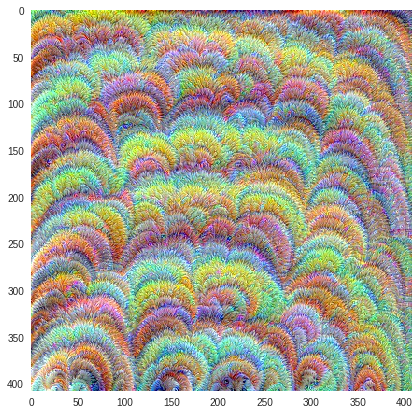

In [12]:
layer = 30
filter = 180

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

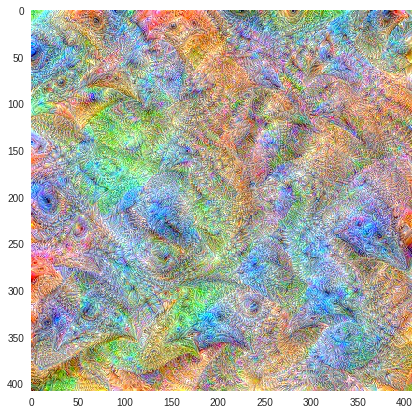

In [14]:
layer = 40
filter = 256

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

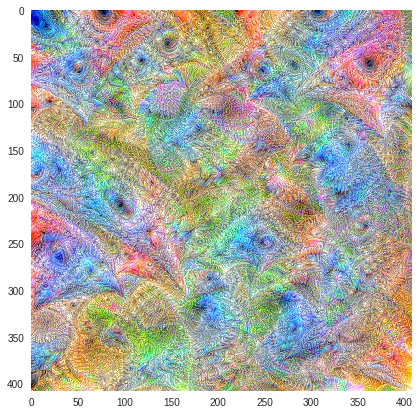

In [16]:
layer = 41
filter = 256

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

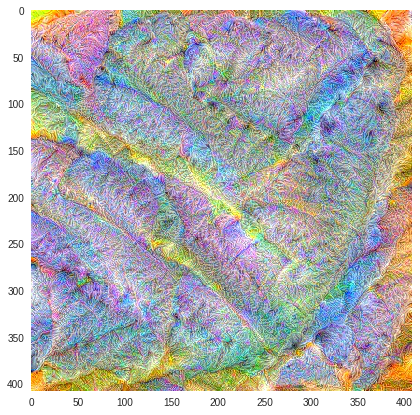

In [17]:
layer = 41
filter = 437

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

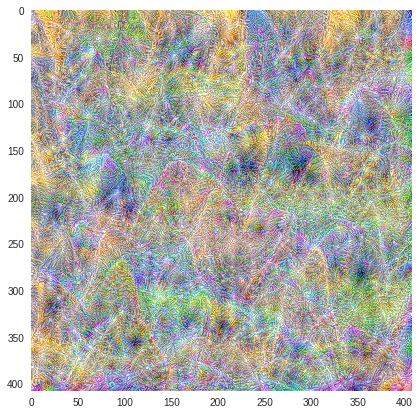

In [18]:
layer = 41
filter = 495

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

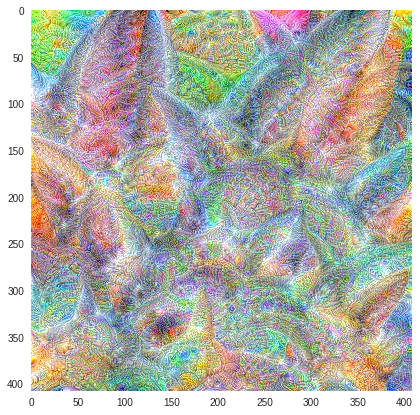

In [19]:
layer = 41
filter = 277

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

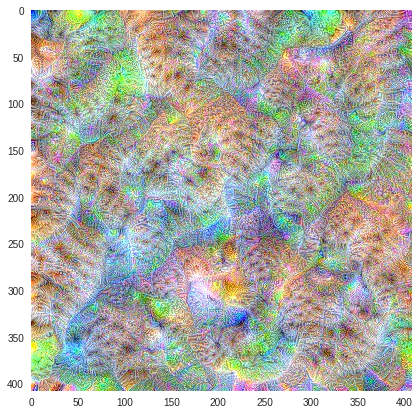

In [20]:
layer = 41
filter = 281

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

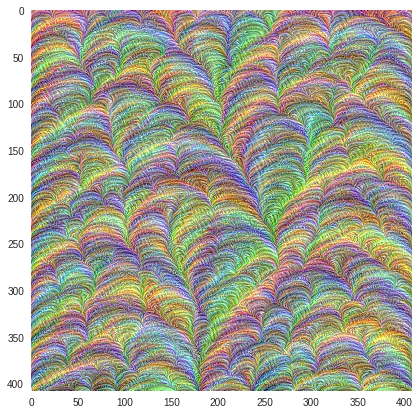

In [21]:
layer = 20
filter = 11

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

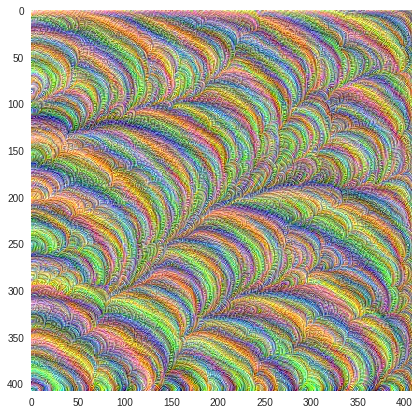

In [22]:
layer = 20
filter = 36

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

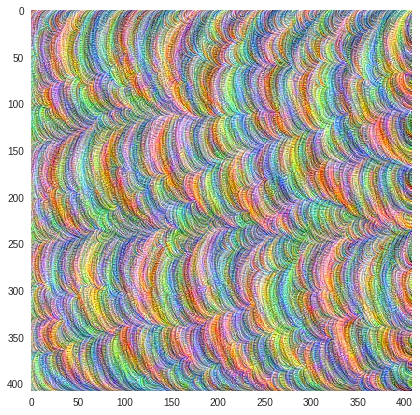

In [23]:
layer = 20
filter = 50

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

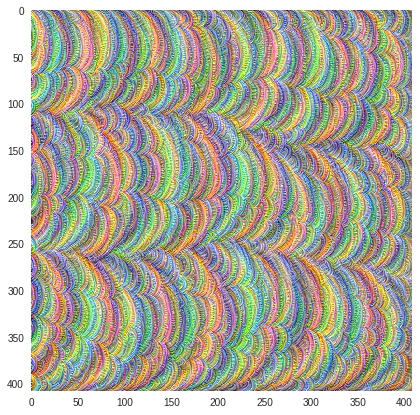

In [24]:
layer = 20
filter = 125

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

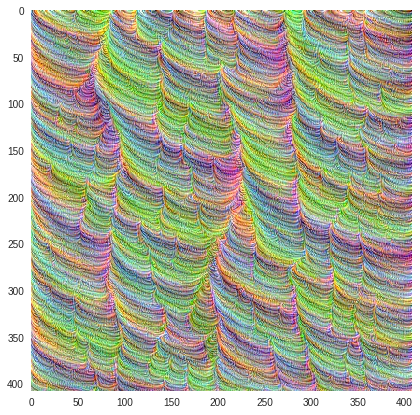

In [25]:
layer = 20
filter = 144

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

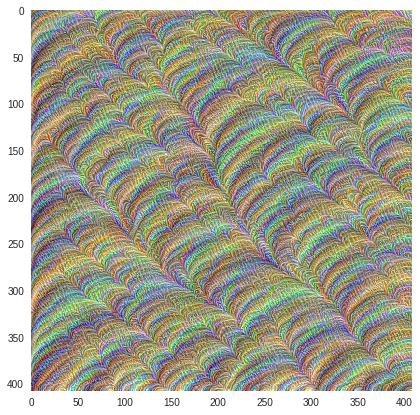

In [26]:
layer = 20
filter = 213

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

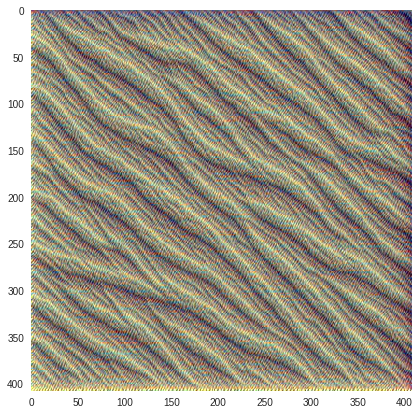

In [30]:
layer = 7
filter = 64

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

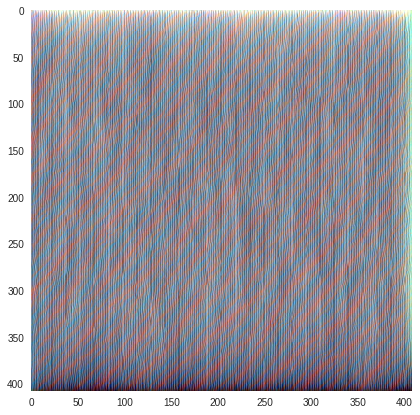

In [31]:
layer = 7
filter = 12

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

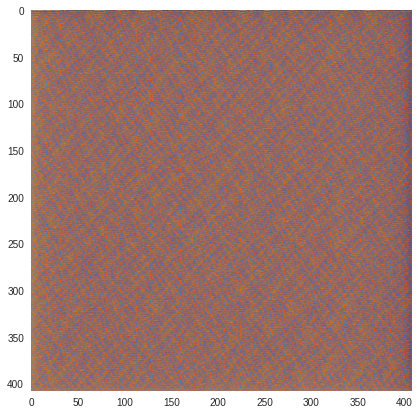

In [32]:
layer = 7
filter = 86

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

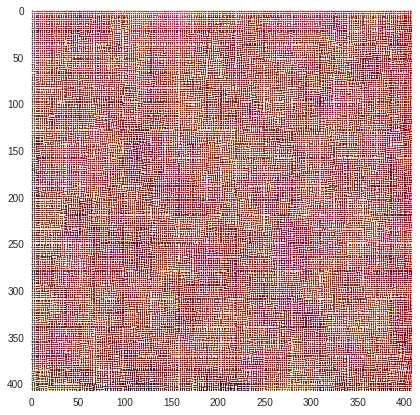

In [33]:
layer = 7
filter = 110

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

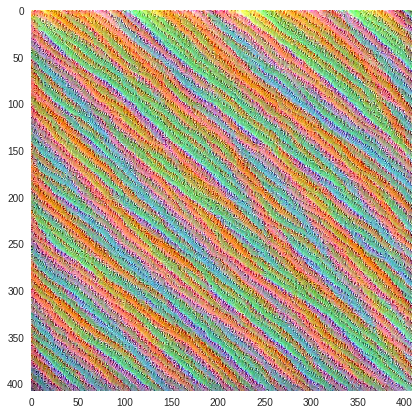

In [46]:
layer = 14
filter = 1

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

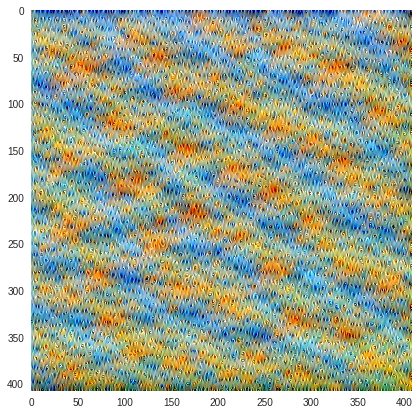

In [47]:
layer = 14
filter = 6

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

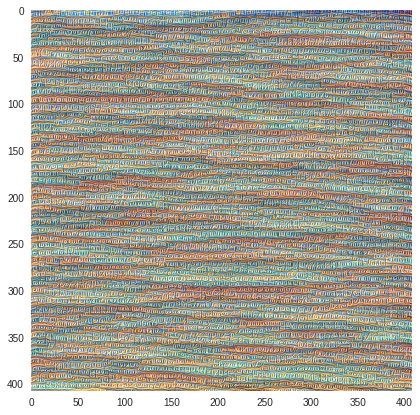

In [48]:
layer = 14
filter = 31

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

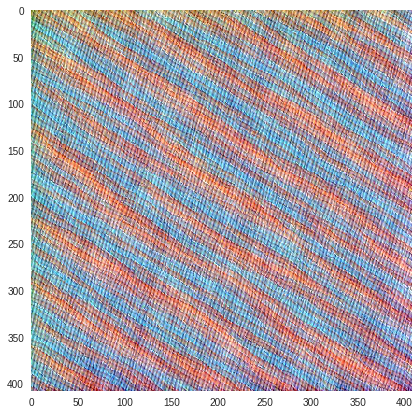

In [49]:
layer = 14
filter = 32

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

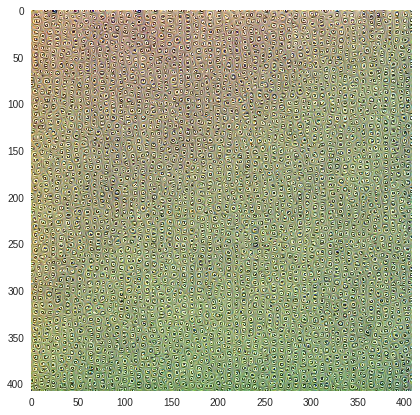

In [50]:
layer = 14
filter = 54

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

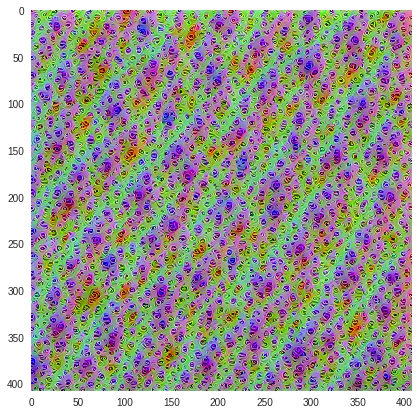

In [51]:
layer = 14
filter = 77

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

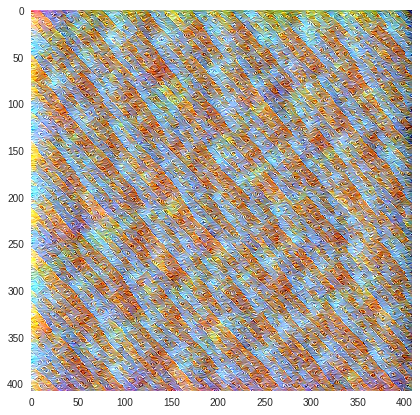

In [52]:
layer = 14
filter = 83

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

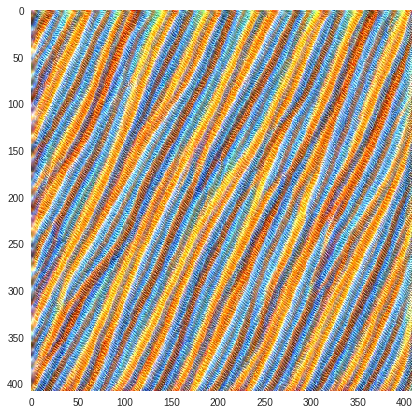

In [53]:
layer = 14
filter = 97

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

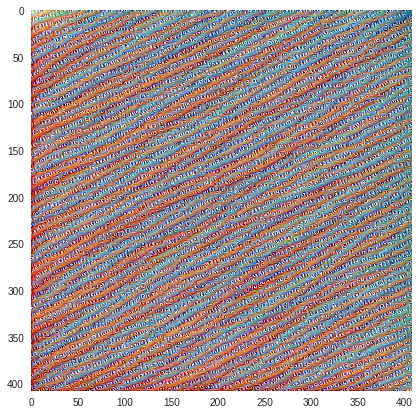

In [54]:
layer = 14
filter = 125

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

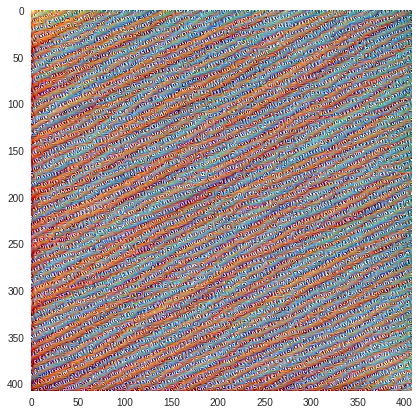

In [55]:
layer = 14
filter = 125

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

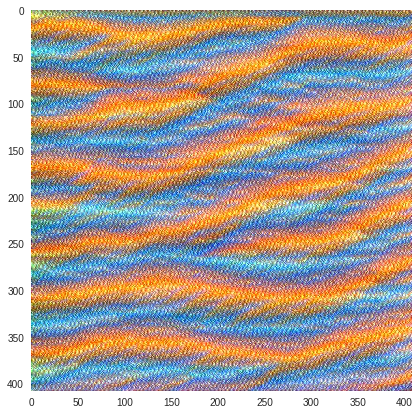

In [45]:
layer = 14
filter = 158

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

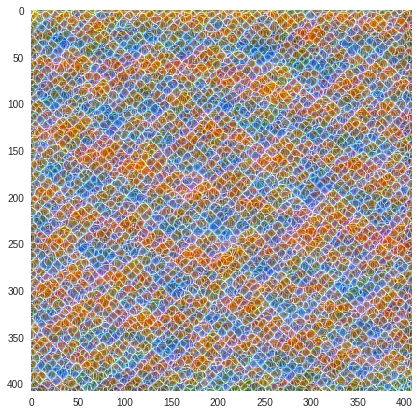

In [56]:
layer = 14
filter = 162

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

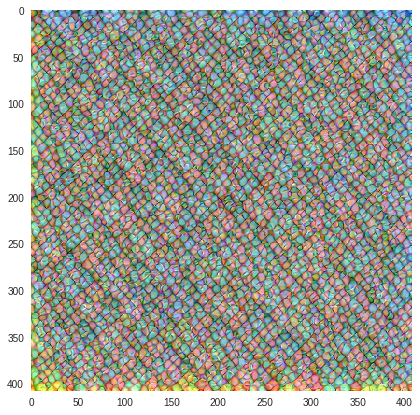

In [57]:
layer = 14
filter = 190

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
5
FV.visualize(layer, filter, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter)+".jpg")
plt.figure(figsize=(7,7))
plt.grid(None)
plt.imshow(img)

## Plots the mean activation per feature map for a specific layer given an input image

In [ ]:
from urllib.request import urlopen

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/2/25/Wattledcranethumb.jpg/206px-Wattledcranethumb.jpg"

In [ ]:
picture = PIL.Image.open(urlopen(url))

In [ ]:
layer = 42
filter = 64  # will be marked with a vertical line in the plot
total_filters_in_layer = 512

In [ ]:
model = vgg16(pre=True).cuda().eval()
set_trainable(model, False)

In [ ]:
sz = 224

In [ ]:
train_tfms, val_tfms = tfms_from_model(vgg16, sz)

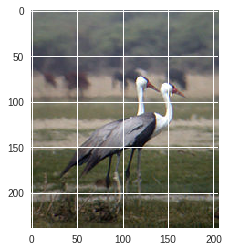

In [81]:
plt.imshow(picture)

In [ ]:
transformed = val_tfms(np.array(picture)/255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


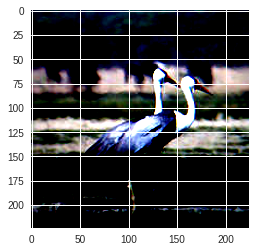

In [71]:
plt.imshow(transformed.transpose(1,2,0))

In [ ]:
activations = SaveFeatures(list(model.children())[layer])

In [ ]:
model(V(transformed)[None]);

In [ ]:
mean_act = [activations.features[0,i].mean().item() for i in range(total_filters_in_layer)]

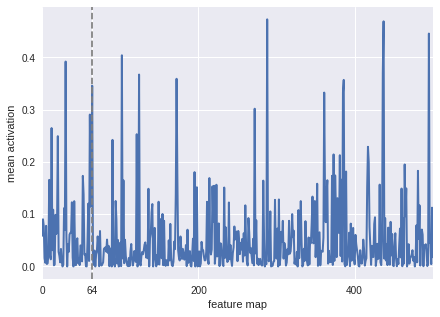

In [75]:
plt.figure(figsize=(7,5))
act = plt.plot(mean_act,linewidth=2.)
extraticks=[filter]
ax = act[0].axes
ax.set_xlim(0,500)
plt.axvline(x=filter, color='grey', linestyle='--')
ax.set_xlabel("feature map")
ax.set_ylabel("mean activation")
ax.set_xticks([0,200,400] + extraticks)
#plt.show()
plt.savefig('mean_activation_layer_'+str(layer)+'_filter_'+str(filter)+'.png')

In [ ]:
thresh = 0.44
[i for i in range(total_filters_in_layer) if mean_act[i]>thresh]

In [ ]:
activations.close()

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/8/89/Orpington_chicken_head.jpg/320px-Orpington_chicken_head.jpg"
picture = PIL.Image.open(urlopen(url))

In [ ]:
layer = 42
filter = 256  # will be marked with a vertical line in the plot
total_filters_in_layer = 512

In [ ]:
model = vgg16(pre=True).cuda().eval()
set_trainable(model, False)

In [ ]:
train_tfms, val_tfms = tfms_from_model(vgg16, sz)

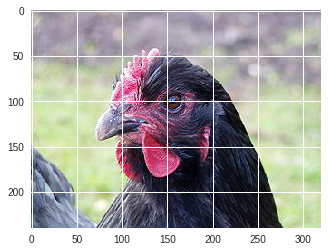

In [130]:
plt.imshow(picture)

In [ ]:
activations = SaveFeatures(list(model.children())[layer])

In [ ]:
model(V(transformed)[None]);

In [ ]:
mean_act = [activations.features[0,i].mean().item() for i in range(total_filters_in_layer)]

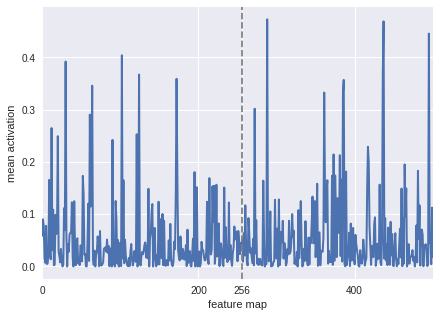

In [134]:
plt.figure(figsize=(7,5))
act = plt.plot(mean_act,linewidth=2.)
extraticks=[filter]
ax = act[0].axes
ax.set_xlim(0,500)
plt.axvline(x=filter, color='grey', linestyle='--')
ax.set_xlabel("feature map")
ax.set_ylabel("mean activation")
ax.set_xticks([0,200,400] + extraticks)
#plt.show()
plt.savefig('mean_activation_layer_'+str(layer)+'_filter_'+str(filter)+'.png')

In [135]:
thresh = 0.44
[i for i in range(total_filters_in_layer) if mean_act[i]>thresh]

[288, 437, 495]

In [ ]:
activations.close()